# Исследование рынка заведений общественного питания Москвы

## 1. Описание проекта

**Цель исследования:** исследование рынка заведений общественного питания Москвы, по результатам которго будет принято решение о выборе подходящего места для открытия нового заведения. Более детальное исследование рынка кофеен и разработка рекоммендаций для открытия новой кофейни. 

**Описание данных:** Датасет moscow_places.csv с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках: 

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽».
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  - 0 — заведение не является сетевым
  - 1 — заведение является сетевым
 - district — административный район, в котором находится заведение, например Центральный административный округ;
 - seats — количество посадочных мест.
 
 **Ход исследования:**
  - Изучение и предобработка данных
  - Общий анализ данных 
  - Анализ рынка кофеен
  - Выводы и рекоммендации
  - Презентация с ключевыми наблюдениями и выводами 

## 2. Изучение и предобработка данных

In [1]:
#загрузим библиотеки
!pip install folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [2]:
#загрузим данные
data = pd.read_csv('C:/Users/Yulia/Desktop/Yandex Practicum/Проекты/9-История по данным(ресто и кофейня)/moscow_places.csv')
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [3]:
#изучим общую информацию о данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
#проверим данные на явные дубликаты
data.duplicated().sum()

0

In [5]:
#проверим количество уникальных названий заведений
data['name'].nunique()

5614

In [6]:
#проверим количество сетевых ресторанов
data['chain'].sum()

3205

In [7]:
#проверим количество точек в сетевых заведениях
chain = data.loc[data['chain'] == 1].groupby('name')['name'].agg('count').sort_values()
chain.head(15)

name
1-я Креветочная        1
Бакинский дворик       1
Уйгурский лагман       1
Deli2Go                1
Баку                   1
Любовь и Сладости      1
Рома                   1
Роллофф                1
Барбарис               1
Харчевниковъ           1
Хинкали                1
Halal food             1
Tasty Thai             1
Хинкальная Экспресс    1
Радуга                 1
Name: name, dtype: int64

In [8]:
#посмортим количество сетевых заведений, в которых только одна точка 
chain[chain == 1].count()

64

In [9]:
#проверим, есть ли в датасете несетевые заведения с несколькими точками
data.loc[data['chain'] == 0]['name'].value_counts().sort_values(ascending=False).head(15)

Кафе                 189
Шаурма                43
Ресторан              34
Столовая              28
Кофейня               12
Бистро                12
Кафе-столовая          9
Буфет                  8
Трапезная              7
Шашлычная              6
Поминальные обеды      5
Блины                  3
Пиццерия               3
Кафе-кулинария         2
Чебуречная             2
Name: name, dtype: int64

In [10]:
#приведем названия к нижнему регистру
data['name'] = data['name'].str.lower()

In [11]:
#поищем дубликаты по имени и адресу 
data[['name', 'address']].duplicated().sum()

3

In [12]:
#удалим дубликаты
data = data.drop_duplicates(subset=['name', 'address'], keep='first')

In [13]:
#посмотрим, какие категории заведений есть в датасете
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [14]:
#посмотрим, какие районы есть в датасете
data['district'].unique()       

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [15]:
#проверим количество заведений по районам
data.groupby('district')['name'].count()

district
Восточный административный округ            798
Западный административный округ             850
Северный административный округ             899
Северо-Восточный административный округ     890
Северо-Западный административный округ      409
Центральный административный округ         2242
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Южный административный округ                892
Name: name, dtype: int64

In [16]:
#проверим максимально высокий рейтинг
data['rating'].max()

5.0

In [17]:
#проверим самый низкий рейтинг
data['rating'].min()

1.0

In [18]:
#проверим, какие категории цен есть в датасете
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [19]:
#посмотрим, как данные распределены по категориям
data.groupby('price')['name'].count()

price
высокие           478
выше среднего     564
низкие            156
средние          2117
Name: name, dtype: int64

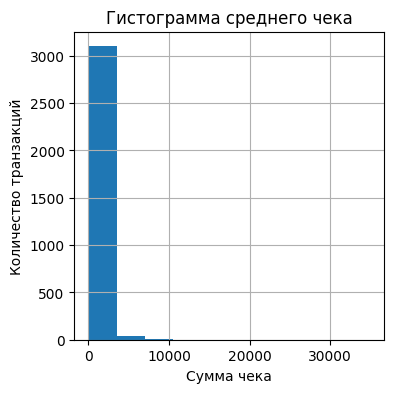

In [48]:
#пострим гистограмму среднего чека
data['middle_avg_bill'].hist(figsize=(4,4))
plt.xlabel('Сумма чека')
plt.ylabel('Количество транзакций')
plt.title('Гистограмма среднего чека')
plt.show()

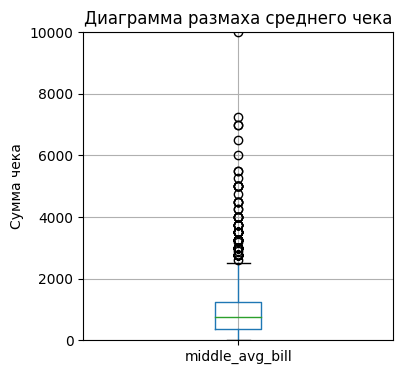

In [52]:
#построим диаграмму размаха среднего чека 
data.boxplot('middle_avg_bill', figsize=(4,4))
plt.ylim(0,10000)
plt.ylabel('Сумма чека')
plt.title('Диаграмма размаха среднего чека')
plt.show()

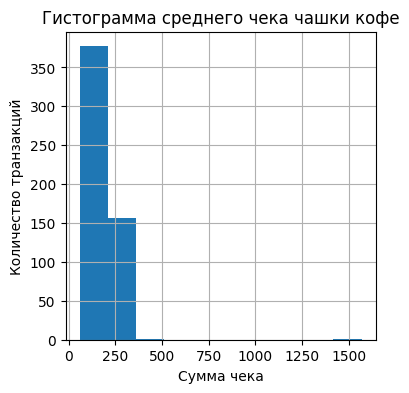

In [51]:
#посторим гистограмму среднего чека чашки кофе
data['middle_coffee_cup'].hist(figsize=(4,4))
plt.xlabel('Сумма чека')
plt.ylabel('Количество транзакций')
plt.title('Гистограмма среднего чека чашки кофе')
plt.show()

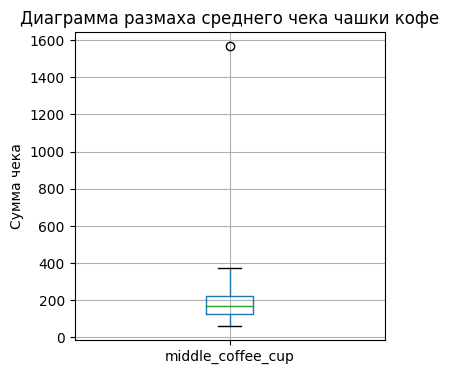

In [54]:
#построим диаграмму размаха среднего чека чашки кофе
data.boxplot('middle_coffee_cup', figsize=(4,4))
plt.ylabel('Сумма чека')
plt.title('Диаграмма размаха среднего чека чашки кофе')
plt.show()

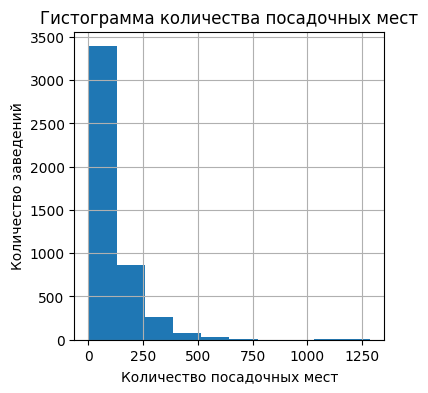

In [55]:
#построим гистограмму количества посадочных мест
data['seats'].hist(figsize=(4,4))
plt.xlabel('Количество посадочных мест')
plt.ylabel('Количество заведений')
plt.title('Гистограмма количества посадочных мест')
plt.show()

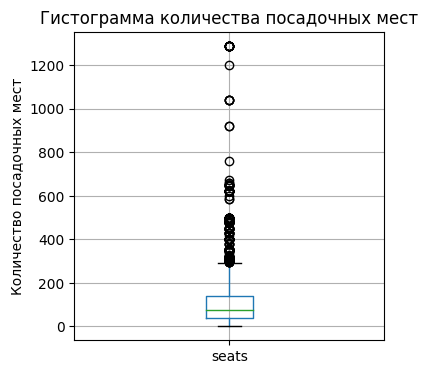

In [56]:
#построим диаграмму размаха количества посадочных мест
data.boxplot('seats', figsize=(4,4))
plt.ylabel('Количество посадочных мест')
plt.title('Гистограмма количества посадочных мест')
plt.show()

In [26]:
#посмотрим количество заведений с 0 количеством посадочных мест
data.query('seats == 0').groupby('category')['name'].count()

category
бар,паб             4
булочная           11
быстрое питание    18
кафе               44
кофейня            24
пиццерия           10
ресторан           20
столовая            5
Name: name, dtype: int64

In [27]:
#заменим 0 в количестве мест на пропуск
data['seats'] = data['seats'].replace(0, np.NaN)

In [28]:
#создадим столбец street с названиями улиц из столбца с адресом
data['street'] = data['address'].map(lambda x: x.split(', ')[1])

In [29]:
#cоздадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно 
def is_24_7(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    return False

data['is_24/7'] = data['hours'].apply(is_24_7)

**Вывод**: в процессе изучения и предобработки данных было выявлено следующее: 
 - в датасете 14 столбцов и 8406 строк
 - в датасете 5614 уникальных названий заведений
 - в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats присутствуют пропуски. Было принято решение оставить пропуски незаполненными, однако будем учитывать это для дальнейшего анализа
 - было обнаружено и удалено 3 дубликата
 - в датасете присутствуют 64 сетевых заведения только с 1 точкой - возможно это ошибка в данных, возможно заведение действительно сетевое, но точки находятся в других городах. Было принято решение эти данные не удалять
 - в данных найдены несетвые заведения с одинаковыми названиями - скорее всего это просто совпадения, было принято решение такие данные не удалять
 - были построены гистограммы для столбцов среднего чека, среднего чека чашки кофе и посадочных мест - в данных присутствуют выбросы, необходимо будет учитывать это для дальнейшего анализа
 - в данных о посадочных местах найдены 136 заведений с 0 количеством посадочных мест. Скорее всего это ошибка в данных и информации о посадочных местах в этих заведениях нет, поэтому было приятно решение заменить 0 на пропуски
 - был создан столбец street с названиями улиц из столбца с адресом
 - cоздадим столбец is_24/7 с обозначением True, если заведение работает ежедневно и круглосуточно 

## 3. Анализ данных

### 3.1 Анализ категорий заведений

In [30]:
#посмотрим на распределение заведений по категориям
category = data.groupby('category')['name'].count().reset_index().rename(columns={'name': 'total'}).sort_values(by='total', ascending=False)
category

,category,total
3,кафе,2377
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


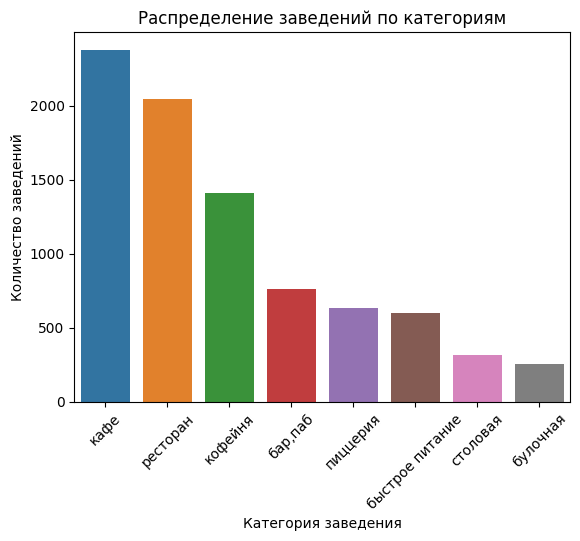

In [31]:
#построим визуализацию 
sns.barplot(data=category, x='category', y='total')
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория заведения')
plt.xticks(rotation = 45)
plt.ylabel('Количество заведений')
plt.show()

**Вывод:** В данных представлены 8 категорий заведений - кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная и столовая. Как видно на графике самая большая категория - кафе, в нее входят 28% заведений. 24% попадает в категорию ресторан, 17% попадает в категорию кофейня. Остальные категории не превышают 10% каждая. Самая маленькая категория - булочная, она составляет 3% заведений. 

### 3.2 Анализ количества посадочных мест в местах по категориям

In [32]:
#посмотрим на медианное значение посадочных мест по категориям
seats = data.groupby('category')['seats'].median().round().sort_values(ascending=False).reset_index().rename(columns={'seats': 'median'})
seats

,category,median
0,ресторан,90.0
1,"бар,паб",84.0
2,кофейня,80.0
3,столовая,80.0
4,быстрое питание,75.0
5,кафе,60.0
6,пиццерия,56.0
7,булочная,52.0


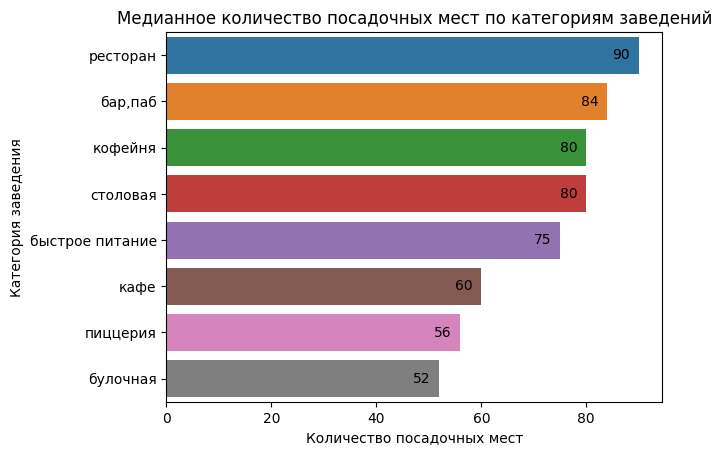

In [33]:
#построим визуализацию
ax = sns.barplot(data=seats, x='median', y='category')

for p in ax.patches:
  height = p.get_height() 
  width = p.get_width() 
  ax.text(x = width-5, y = p.get_y()+(height/2), s = '{:.0f}'.format(width), va = 'center') 

plt.title('Медианное количество посадочных мест по категориям заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.show()

**Вывод:** для анализа были взяты медианные значения посадочных мест по категориям заведений, так как на этапе предобработки данных мы обнаружили выбросы в данных по посадочным местам. Как видно на графике, самое высокое количество посадочных мест у заведений категории ресторан - 90. Самое низкое количество у булочных - 52 посадочных мест. 

###  3.3 Анализ соотношения сетевых и несетевых заведений

In [34]:
#посчитаем количество сетевых и несетевых заведений
chain = data.groupby('chain')['name'].count()
chain.reset_index().rename(columns={'name': 'total'})

,chain,total
0,0,5200
1,1,3203


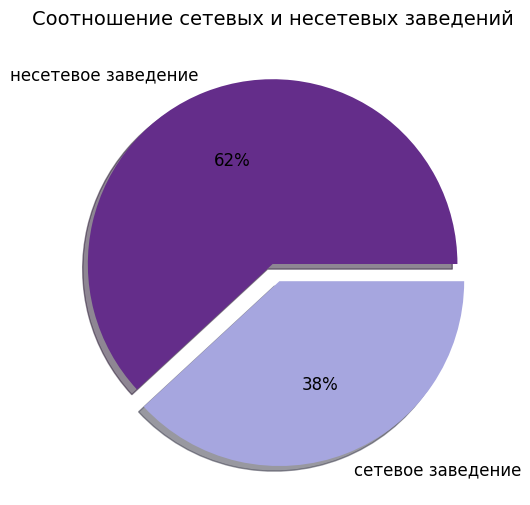

In [35]:
#построим визуализацию
plt.figure(figsize=(6,6))
plt.pie(chain, autopct='%1.0f%%', labels = ['несетевое заведение', 'сетевое заведение'], textprops={'fontsize': 12}, explode=(0,0.1), shadow=True, colors=['#642d8a', '#a6a6df'])
plt.title('Соотношение сетевых и несетевых заведений', fontdict={'fontsize': 14})
plt.show()

**Вывод:** Как видно на графике, несетевых заведений в датасете представлено больше - 62%. 38% датасета - это сетевые заведения.  

### 3.4 Анализ соотношения сетевых и несетевых заведений по категориям

In [36]:
#посчитаем долю сетевых заведений по категориям
chain_cat = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count').rename(columns={0: 'not_chain', 1: 'chain'})
chain_cat['total'] = chain_cat['chain'] + chain_cat['not_chain']
chain_cat['chain_share'] = ((chain_cat['chain'] / chain_cat['total']) * 100).round(2)
chain_cat

chain,not_chain,chain,total,chain_share
category,,,,
"бар,паб",596,168,764,21.99
булочная,99,157,256,61.33
быстрое питание,371,232,603,38.47
кафе,1598,779,2377,32.77
кофейня,693,720,1413,50.96
пиццерия,303,330,633,52.13
ресторан,1313,729,2042,35.70
столовая,227,88,315,27.94


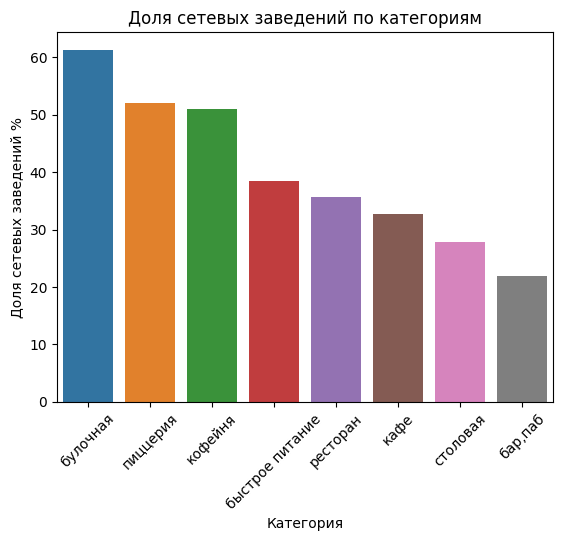

In [37]:
#построим визуализацию
sns.barplot(data=chain_cat.reset_index().sort_values(by='chain_share', ascending=False), x='category', y='chain_share')
plt.xlabel('Категория')
plt.xticks(rotation=45)
plt.ylabel('Доля сетевых заведений %')
plt.title('Доля сетевых заведений по категориям')
plt.show()

**Вывод:** Как видим на графике есть категории, в которых сетевых заведений больше, чем несетевых - это булочная (61% сетевых заведений), кофейня (51%) и пиццерия (52%). В остальных категориях большинство заведений несетевые. Наименьшая доля сетевых заведений в категории бар/паб - 22%. 

### 3.5 Анализ топ-15 популярных сетей

In [38]:
#найдем топ-15 сетей и их категорию
top_15 = data.query('chain == 1').groupby('name')['category'].count().sort_values(ascending=False).head(15).reset_index().rename(columns={'category': 'total'})
top_15 = data.query('name in @top_15.name').pivot_table(index='name', values='category', aggfunc={'count','max'}).sort_values(by='count', ascending=False).rename(columns={'count':'total', 'max': 'category'})
top_15

,total,category
name,,
шоколадница,120,кофейня
домино'с пицца,77,пиццерия
додо пицца,74,пиццерия
one price coffee,72,кофейня
яндекс лавка,69,ресторан
cofix,65,кофейня
prime,50,ресторан
хинкальная,44,столовая
кофепорт,42,кофейня


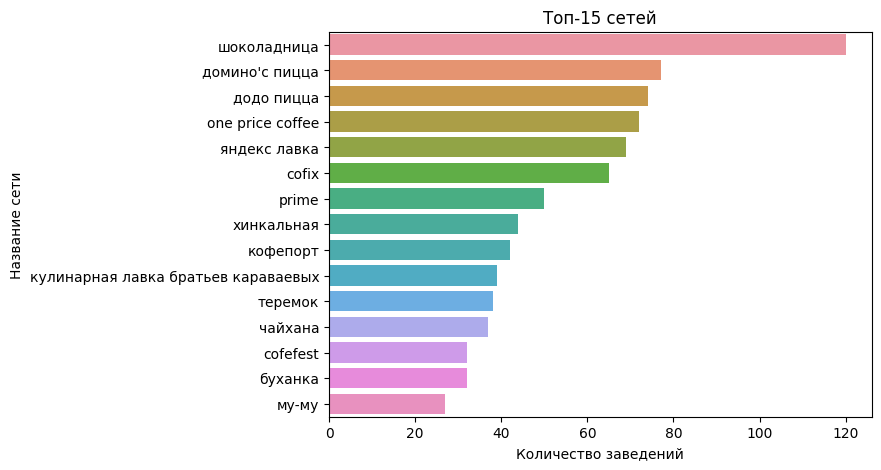

In [39]:
#построим график
plt.figure(figsize=(7,5))
sns.barplot(data = top_15.reset_index(), x='total', y='name')
plt.title('Топ-15 сетей')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.show()

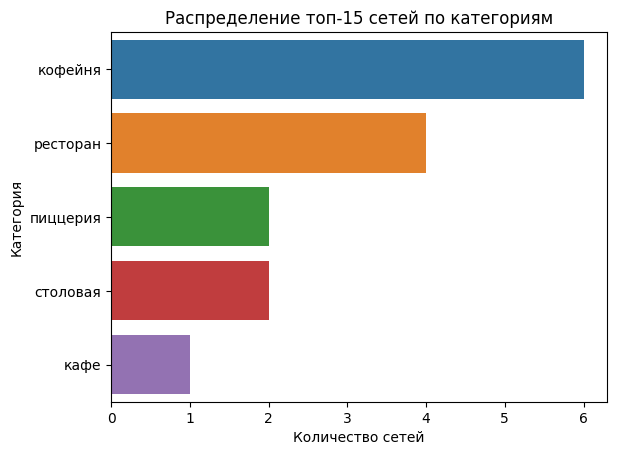

In [40]:
#посмотрим как топ-15 сетей распределены по категориям
sns.barplot(data = top_15.reset_index().groupby('category', as_index=False)['name'].count().sort_values(by='name', ascending=False), x='name', y='category')
plt.title('Распределение топ-15 сетей по категориям')
plt.ylabel('Категория')
plt.xlabel('Количество сетей')
plt.show()

**Вывод:** На графике отображены топ-15 сетей Москвы. Самая крупная сеть - Шоколадница, кофейня со 120 точками. Самая малая сеть - Му-Му, столовая с 27 точками. Заведения относятся к разным категориям - кофейня, пиццерия, ресторан, кафе, столовая. Больше всего кофеен - 6, меньше всего кафе - 1. Многие их этих сетей работают по франшизе. 

### 3.6 Анализ административных районов Москвы

In [41]:
#найдем количество заведений по категориям по каждому району
district = data.pivot_table(index='district', columns = 'category', values='name', aggfunc='count')
district['total'] = district.sum(axis=1)
district = district.sort_values(by='total')
district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,238,150,71,218,24,850
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Южный административный округ,68,25,85,264,131,73,202,44,892
Северный административный округ,68,39,58,235,193,77,188,41,899
Центральный административный округ,364,50,87,464,428,113,670,66,2242


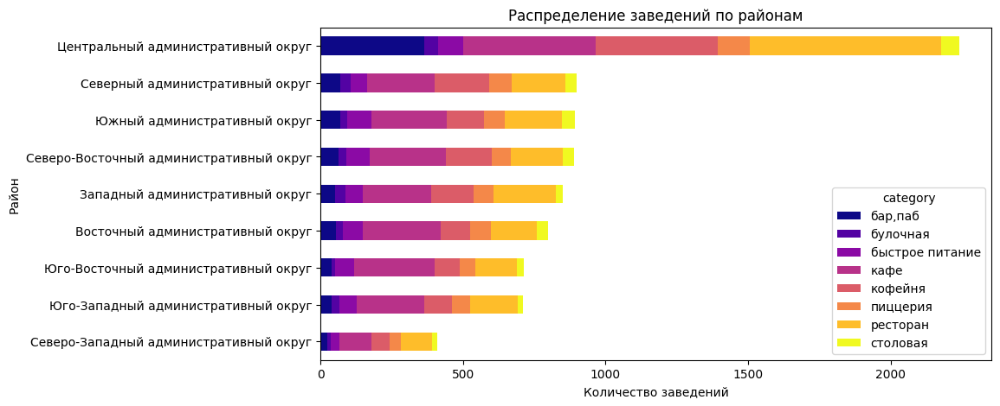

In [42]:
#построим визуализацию
district_1 = district.drop('total', axis=1)
district_1.plot(kind='barh', stacked=True, colormap='plasma', figsize=(10,5))
plt.title('Распределение заведений по районам')
plt.xlabel('Количество заведений')
plt.ylabel('Район')
plt.show()

**Вывод:** Абсолютным лидером по количеству заведений является Центральный район - больше 2000 точек.  При этом Центральный район является самым маленьким по площади. Но это неудивительно, центр города всегда является местом скопления заведений общественного питания в силу высокого спроса.  С точки зрения категорий заведений, в Центральном районе больше всего ресторанов, кафе и кофеен. Районом с наименьшим количеством заведений является Северо-Западный административный округ - меньше 500 точек. С точки зрения категорий, в Северо-Западном округе также лидируют кафе, рестораны и кофейни. Остальные районы имеют примерно одинаковое количество заведений - от 700 до 900 и такой же набор лидирующих категорий - рестораны, кафе и кофейни. 

### 3.7 Анализ средних рейтингов по категориям заведений

In [43]:
#найдем средние рейтинги по категориям заведений
rating = data.groupby('category')['rating'].mean().round(2).reset_index().sort_values(by='rating', ascending=False)
rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


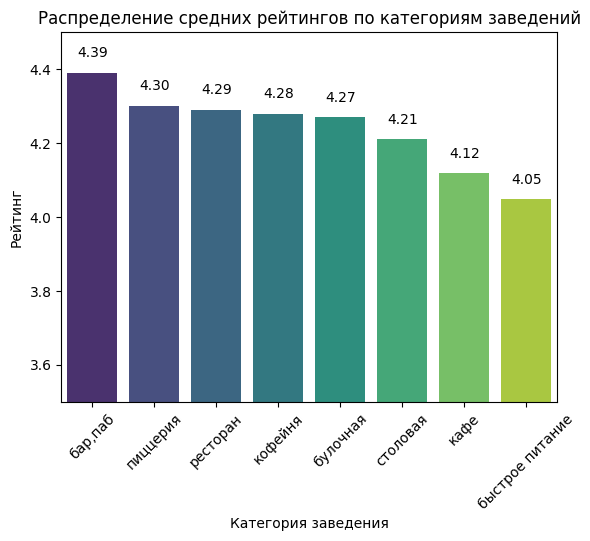

In [44]:
#построим график
ax_1 = sns.barplot(data=rating, y='rating', x='category', palette='viridis')

for p in ax_1.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.2f}'.format(p.get_height())
                ax_1.text(_x, _y, value, ha="center") 

plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45)
plt.ylim(3.5, 4.5)
plt.show()

**Вывод:** Средние рейтинги не сильно отличаются между разными категориями заведений. Самый высокий рейтинг у категории бар/паб - 4,39. Самый низкий у категории быстрое питание - 4,05. 

### 3.8 Фоновая картограмма  со средним рейтингом

In [45]:
#подготовим датасет
rating_district = data.groupby('district')['rating'].agg('mean').round(2).reset_index()
rating_district.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [83]:
#построим фоновую картограмму
import json
with open('C:/Users/Yulia/Desktop/Yandex Practicum/Проекты/9-История по данным(ресто и кофейня)/admin_level_geomap.geojson', 'r', encoding='utf8') as f:
    geo_json = json.load(f)

moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

**Вывод:** Самый высокий средний рейтинг наблюдается в Центральном районе - 4,38. Это довольно логично, обычно в центре скоплены более дорогие заведения с высоким уровнем обслуживания. В топ-3 района по среднему рейтингу входят также Северный и Северно-Западные округа. Самый низкий средний рейтинг у Юго-Восточного округа - 4,1.

### 3.9 Карта с заведениями

In [84]:
#построим карту со всеми заведениями
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)
m

**Вывод:** Как видим на карте самое большое количество заведений можно наблюдать в Центральном округе. Много заведений также находятся в  Северном и Южном округах.  

### 3.10 Топ-15 улиц по количеству заведений

In [85]:
#найдем топ-15 улиц по количеству заведений
street_top = data.groupby('street', as_index=False)['name'].count().sort_values(by='name', ascending=False).head(15).rename(columns={'name': 'total'})
street_top

,street,total
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [86]:
#посмотрим к каким района относятся эти улицы
data.query('street in @street_top.street').pivot_table(index='street', values='district', aggfunc={'count', 'max'}).rename(columns={'count': 'total', 'max': 'district'}).sort_values(by='total', ascending=False)

,total,district
street,,
проспект Мира,183,Центральный административный округ
Профсоюзная улица,122,Юго-Западный административный округ
проспект Вернадского,108,Юго-Западный административный округ
Ленинский проспект,107,Южный административный округ
Ленинградский проспект,95,Северный административный округ
Дмитровское шоссе,88,Северо-Восточный административный округ
Каширское шоссе,77,Южный административный округ
Варшавское шоссе,76,Южный административный округ
Ленинградское шоссе,70,Северный административный округ


In [87]:
#построим на распределение по категориям заведений на топ-15 улицах
street_cat = data.query('street in @street_top.street').pivot_table(index='street', columns='category', values='name', aggfunc='count').fillna(0)
street_cat['total'] = street_cat.sum(axis=1)
street_cat = street_cat.sort_values(by='total', ascending=False)
street_cat

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект Мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,183.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0,77.0
Варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0,76.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70.0


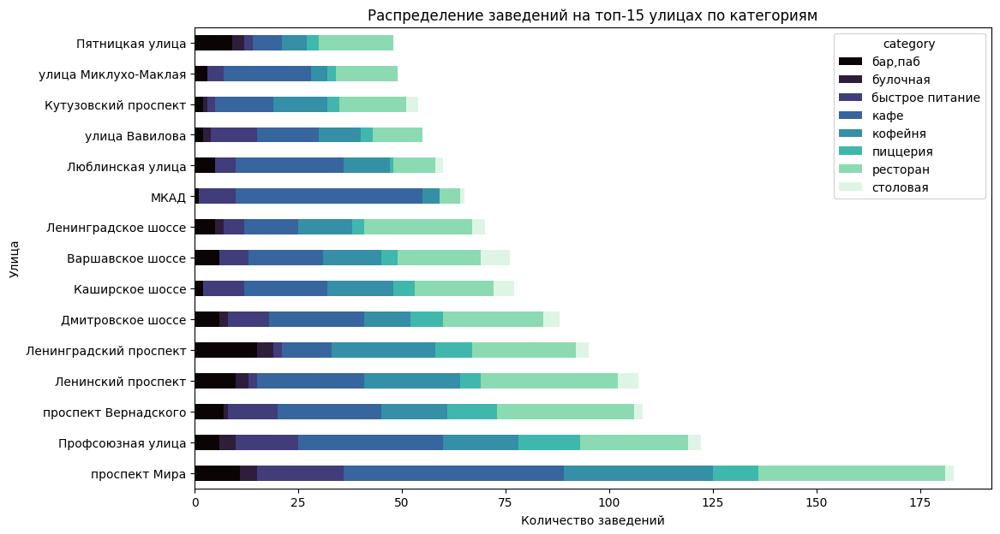

In [88]:
#построим визуализацию
street = street_cat.drop('total', axis=1)
street.plot(kind='barh', stacked=True, colormap='mako', figsize=(12,7))
plt.title('Распределение заведений на топ-15 улицах по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Улица')
plt.show()

**Вывод:** Лидером среди улиц по количеству заведений является проспект Мира - 184 точки. Проспект Мира находится в Центральном районе, лидеру по количеству заведений. С точки зрения категорий, на проспекте Мира можно найти больше всего кафе, ресторанов и кофеен. В топ-3 улицы по количеству заведений входят также и Профсоюзная улица и проспект Вернандского  - 122 и 108 заведений соответственно. Обе улицы располагаются в Юго-Западном округе. Необходимо отметить, что этот район является аутсайдером в рейтинге районов по количеству заведений. С точки зрения категорий, снова чаще всего наблюдаются кафе, рестораны и кофейни. Улицей с наименьшим количеством заведений среди топ-15 улиц является Пятницкая улица - 48 точек. Данная улица также относится к Центральному району. Однако необходимо иметь в виду также и протяженность улиц. Например, Пятницкая улица имеет протяженность в 1,8км, тогда как проспект Мира имеет протяженность 8,9км. Если учитывать эти данные, плотность заведений на км Пятницкой улицы выше, чем плотность на проспекте Мира. На Пятницкой улице наблюдается больше всего ресторанов, баров/пабов и кафе. 

### 3.11 Анализ улиц, на которых находится только один объект общепита

In [89]:
#найдем улицы с 1 заведением
street_one = data.groupby('street', as_index=False)['name'].count().query('name == 1')
street_one['name'].count()

458

In [90]:
#отфильтруем датасет по этим улицам
data_street_one = data.query('street in @street_one.street')

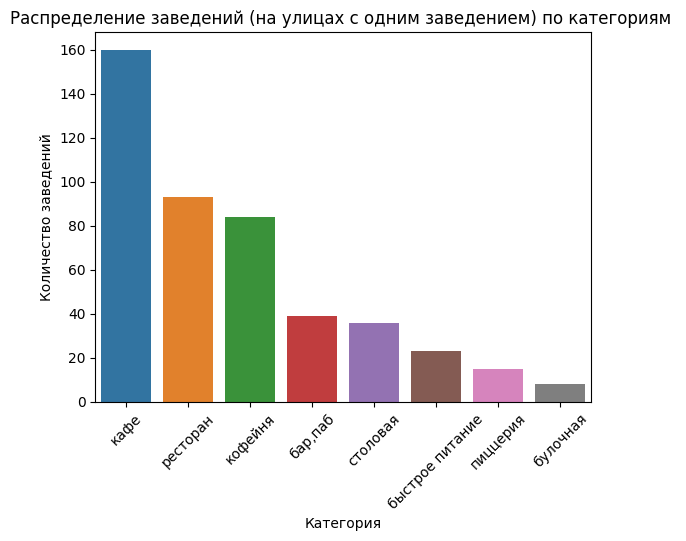

In [91]:
#посмотрим на распределение по категориям
sns.barplot(data = data_street_one['category'].value_counts().reset_index(), x='index', y='category')
plt.title('Распределение заведений (на улицах с одним заведением) по категориям ')
plt.xlabel('Категория')
plt.xticks(rotation=45)
plt.ylabel('Количество заведений')
plt.show()

In [92]:
#построим карту со всеми заведениями
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m2)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_street_one.apply(create_clusters, axis=1)
m2

In [93]:
#найдем средний рейтинг таких заведений
data_street_one['rating'].mean().round(2)

4.24

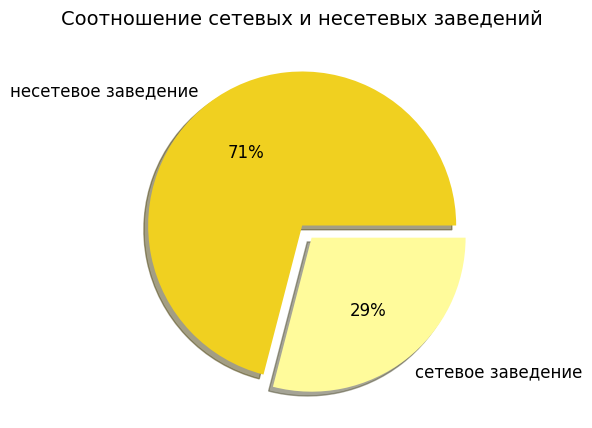

In [94]:
#посмотрим на распределение на сетевые/несетвые заведния
plt.figure(figsize=(5,5))
plt.pie(data_street_one.groupby('chain')['name'].count(), autopct='%1.0f%%', labels = ['несетевое заведение', 'сетевое заведение'], textprops={'fontsize': 12}, explode=(0,0.1), shadow=True, colors=['#f0d020', '#fffb9b'])
plt.title('Соотношение сетевых и несетевых заведений', fontdict={'fontsize': 14})
plt.show()

**Вывод:** Всего в Москве 458 улиц с одним заведением. Больше всего среди этих заведений кафе, ресторанов и кофеен, меньше всего булочных, что совпадает с общим распределением заведений по категориям. Чаще всего такие заведения располагаются в Центральном округе, в остальных округах заведения распределены довольно равномерно. Средний рейтинг довольно высокий - 4,24. 71% заведений является несетевыми заведениями, что выше, если смотреть на общее распределение заведений. Исходя из этого можно сделать вывод, что рестораторы предпочитают открывать сетевые точки на более популярных улицах. 

### 3.12 Анализ средних чеков заведений

In [95]:
#найдем медианное значение чека по району
avg_bill = data.groupby('district', as_index = False)['middle_avg_bill'].median()
avg_bill.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [97]:
#построим фоновую картограмму
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Медианное значение чека заведений по районам',
).add_to(m3)
m3

**Вывод:** Как можно было предвидеть, одним из районов с самыми высокими ценами оказался Центральный округ. Однако Западный округ равняется с Центральным по уровню цен. Это тоже не удивительно, так как Западный округ являются одним из самых престижных в Москве и лидирует по числу новостроек бизнес- и премиум-класса, а соответственно и заведений общественного питания, рассчитанных на людей с высокими доходами. Цены в остальных округах ниже и находятся примерно на одном уровне. Нельзя однозначно сказать, что цены в заведениях напрямую зависят от удаленности от центра. Скорее от района, его инфраструктуры и доходов среднестатистического жителя района. 

### 3.13 Анализ часов работы заведений

In [98]:
#посмотрим на распределение заведений 24/7 по категориям
is_24 = data.pivot_table(index='category', columns='is_24/7', values='name', aggfunc='count').rename(columns={0: 'not_24/7', 1: 'is_24/7'})
is_24['share'] = round((is_24['is_24/7'] / (is_24['not_24/7'] + is_24['is_24/7'])) * 100, 2)
is_24

is_24/7,not_24/7,is_24/7,share
category,,,
"бар,паб",712,52,6.81
булочная,232,24,9.38
быстрое питание,453,150,24.88
кафе,2110,267,11.23
кофейня,1354,59,4.18
пиццерия,602,31,4.90
ресторан,1907,135,6.61
столовая,303,12,3.81


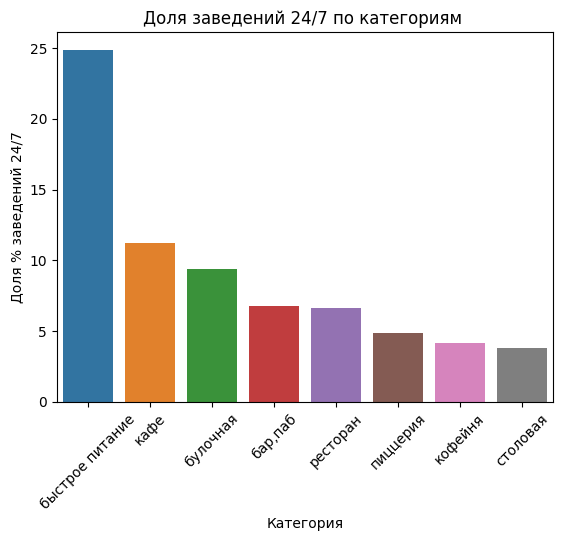

In [99]:
#построим график
sns.barplot(data = is_24.reset_index().sort_values(by='share', ascending=False) , x = 'category', y = 'share')
plt.title('Доля заведений 24/7 по категориям ')
plt.xlabel('Категория')
plt.xticks(rotation=45)
plt.ylabel('Доля % заведений 24/7')
plt.show()

In [100]:
#посмотрим на распределение заведений 24/7 по районам
district_24 = data[data['is_24/7'] == True].groupby('district', as_index=False)['name'].count().rename(columns={'name': 'total'}).sort_values(by='total', ascending=False)
district_24

,district,total
5,Центральный административный округ,131
0,Восточный административный округ,97
6,Юго-Восточный административный округ,93
3,Северо-Восточный административный округ,75
8,Южный административный округ,75
7,Юго-Западный административный округ,73
1,Западный административный округ,72
2,Северный административный округ,71
4,Северо-Западный административный округ,43


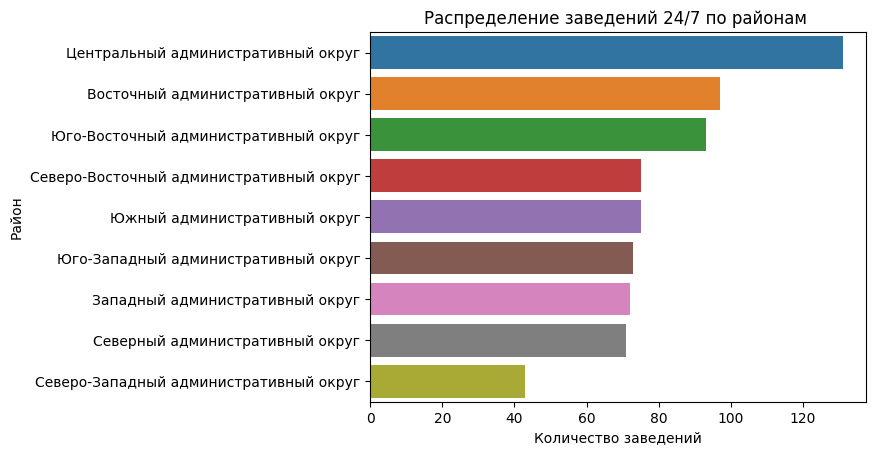

In [101]:
#построим график
sns.barplot(data=district_24, y='district', x='total')
plt.title('Распределение заведений 24/7 по районам ')
plt.xlabel('Количество заведений')
plt.ylabel('Район')
plt.show()

**Вывод:** Самая высокая доля заведений 24/7 в категории быстрое питание - почти 25%. В остальных категорях доля заведений 24/7 занимает около 10% и меньше. Меньше всего круглосуточных заведений в категории столовая. Самая высокая концентрация заведений 24/7 в Центральном районе - 131 точка. Самая мальенькая в Северо-Западном округе - 43 заведения. 

### 3.14 Анализ особенностей заведений с плохими рейтингами

In [102]:
#сделаем категоризацию данных для рейтинга больше и меньше 4
def rating_category(rating):
    if rating < 4:
        return 'bad'
    return 'good'
data['rating_category'] = data['rating'].apply(rating_category)

In [103]:
#найдем долю заведений с рейтингом ниже 4 по категориям
rating_category = data.pivot_table(index='category', columns='rating_category', values='name', aggfunc='count')
rating_category['share'] = round((rating_category['bad'] / (rating_category['bad'] + rating_category['good'])) * 100, 2)
rating_category

rating_category,bad,good,share
category,,,
"бар,паб",40,724,5.24
булочная,30,226,11.72
быстрое питание,162,441,26.87
кафе,543,1834,22.84
кофейня,138,1275,9.77
пиццерия,35,598,5.53
ресторан,177,1865,8.67
столовая,44,271,13.97


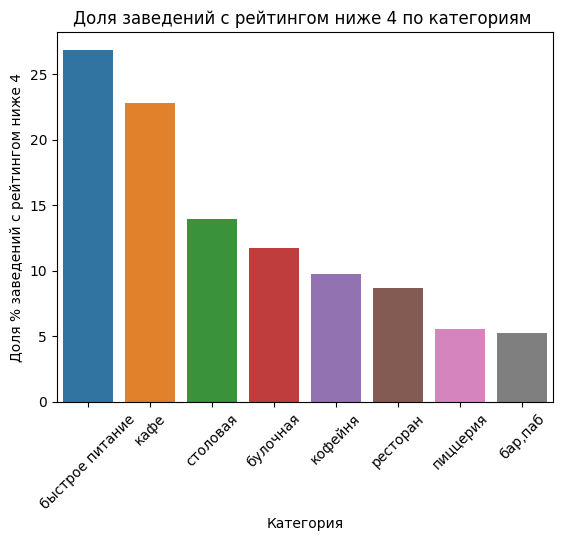

In [104]:
#построим визуализацию
sns.barplot(data=rating_category.reset_index().sort_values(by='share', ascending=False), y='share', x='category')
plt.title('Доля заведений с рейтингом ниже 4 по категориям ')
plt.xlabel('Категория')
plt.xticks(rotation=45)
plt.ylabel('Доля % заведений с рейтингом ниже 4')
plt.show()

In [105]:
#посчитаем разницу в среднем чеке в заведених с плохим и хорошим рейтигом
bill_diff = data.pivot_table(index='category', columns='rating_category', values='middle_avg_bill', aggfunc='median')
bill_diff['difference_%'] = round((1-bill_diff['bad'] / bill_diff['good']) * 100, 2)
bill_diff.sort_values(by='difference_%', ascending=False)

rating_category,bad,good,difference_%
category,,,
ресторан,500.0,1250.0,60.00
"бар,паб",750.0,1250.0,40.00
булочная,337.5,500.0,32.50
кофейня,300.0,400.0,25.00
кафе,450.0,550.0,18.18
пиццерия,500.0,600.0,16.67
быстрое питание,342.5,400.0,14.38
столовая,275.0,300.0,8.33


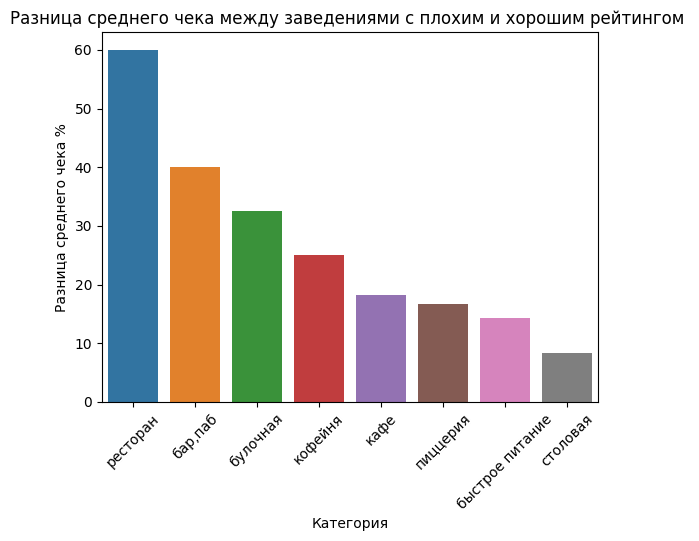

In [106]:
#построим визуализацию
sns.barplot(data=bill_diff.reset_index().sort_values(by='difference_%', ascending=False), y='difference_%', x='category')
plt.title('Разница среднего чека между заведениями с плохим и хорошим рейтингом ')
plt.xlabel('Категория')
plt.xticks(rotation=45)
plt.ylabel('Разница среднего чека %')
plt.show()

**Вывод:** В рамках данного анализа все заведения были поделены на 2 категории: хороший рейтинг - равен или выше 4; плохой рейтинг - меньше 4. Категорией с самой высокой долей заведений с плохим рейтингом является быстрое питание - 27%. Довольно высокая доля и у категории кафе - 23%. Категорией с самой низкой долей заведений с плохим рейтингом оказалась категория бар/паб - 5%. Также необходимо отметить, что во всех категориях без исключения медианный чек заведений с плохим рейтингом ниже чека заведений с хорошим рейтингом. Самая большая разница в категории ресторан - 60%. Чеки заведений с плохим и хорошим рейтингом в категории бар/паб отличаются на 40%. Самая менее значительная разница в категории столовая - всего 8%. Скорее всего заведения с хорошим рейтингом отличаются высоким уровнем обслуживания и цены в таких заведениях соответственно выше. 

### 3.15 Вывод 

По результатам исследования были сделаны следующие заключения: 

- В данных представлены 8 категорий заведений - кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная и столовая. Как видно на графике самая большая категория - кафе, в нее входят 28% заведений. 24% попадает в категорию ресторан, 17% попадает в категорию кофейня. Самая маленькая категория - булочная, она составляет 3% заведений.
- Самое высокое количество посадочных мест у заведений категории ресторан - 90. Самое низкое количество у булочных - 52 посадочных места.
- Несетевых заведений в датасете представлено больше - 62%. 38% датасета - это сетевые заведения.
- Есть категории, в которых сетевых заведений больше, чем несетевых - это булочная (61% сетевых заведений), кофейня (51%) и пиццерия (52%). В остальных категориях большинство заведений несетевые. Наименьшая доля сетевых заведений в категории бар/паб - 22%.
- Самая крупная сеть - Шоколадница, кофейня со 120 точками. Самая малая сеть - Му-Му, столовая с 27 точками.
- Абсолютным лидером по количеству заведений является Центральный район - больше 2000 точек. Районом с наименьшим количеством заведений является Северо-Западный административный округ - меньше 500 точек. С точки зрения категорий, в обоих округах лидируют кафе, рестораны и кофейни. 
- Средние рейтинги не сильно отличаются между разными категориями заведений. Самый высокий рейтинг у категории бар/паб - 4,39. Самый низкий у категории быстрое питание - 4,05.
- Самый высокий средний рейтинг наблюдается в Центральном районе - 4,38. В топ-3 района по среднему рейтингу входят также Северный и Северно-Западные округа. Самый низкий средний рейтинг у Юго-Восточного округа - 4,1.
- Лидером среди улиц по количеству заведений является проспект Мира (Центральный округ) - 184 точки. В топ-3 улицы по количеству заведений входят также и Профсоюзная улица и проспект Вернандского - 122 и 108 заведений соответственно. Обе улицы располагаются в Юго-Западном округе. С точки зрения категорий, снова чаще всего наблюдаются кафе, рестораны и кофейни. Улицей с наименьшим количеством заведений среди топ-15 улиц является Пятницкая улица (Центральный округ) - 48 точек. Однако необходимо иметь в виду также и протяженность улиц. Например, Пятницкая улица имеет протяженность в 1,8км, тогда как проспект Мира имеет протяженность 8,9км. Если учитывать эти данные, плотность заведений на км Пятницкой улицы выше, чем плотность на проспекте Мира. На Пятницкой улице наблюдается больше всего ресторанов, баров/пабов и кафе.
- Всего в Москве 458 улиц с одним заведением. Больше всего среди этих заведений кафе, ресторанов и кофеен, меньше всего булочных, что совпадает с общим распределением заведений по категориям. Чаще всего такие заведения располагаются в Центральном округе, в остальных округах заведения распределены довольно равномерно. Средний рейтинг довольно высокий - 4,24. 71% заведений является несетевыми заведениями, что выше, если смотреть на общее распределение заведений. Исходя из этого можно сделать вывод, что рестораторы предпочитают открывать сетевые точки на более популярных улицах.
- Районами с самыми высокими ценами оказался Центральный и Западный округа. Цены в остальных округах ниже и находятся примерно на одном уровне. Нельзя однозначно сказать, что цены в заведениях напрямую зависят от удаленности от центра. Скорее от района, его инфраструктуры и доходов среднестатистического жителя района.
- Самая высокая доля заведений 24/7 в категории быстрое питание - почти 25%. В остальных категорях доля заведений 24/7 занимает около 10% и меньше. Меньше всего круглосуточных заведений в категории столовая. Самая высокая концентрация заведений 24/7 в Центральном районе - 131 точка. Самая мальенькая в Северо-Западном округе - 43 заведения.
- В рамках данного анализа все заведения были поделены на 2 категории: хороший рейтинг - равен или выше 4; плохой рейтинг - меньше 4. Категорией с самой высокой долей заведений с плохим рейтингом является быстрое питание - 27%. Довольно высокая доля и у категории кафе - 23%. Категорией с самой низкой долей заведений с плохим рейтингом оказалась категория бар/паб - 5%. Также необходимо отметить, что во всех категориях без исключения медианный чек заведений с плохим рейтингом ниже чека заведений с хорошим рейтингом. Самая большая разница в категории ресторан - 60%. Чеки заведений с плохим и хорошим рейтингом в категории бар/паб отличаются на 40%. Самая менее значительная разница в категории столовая - всего 8%. 

 ## 4. Исследование рынка кофеен и разработка рекоммендаций для открытия новой кофейни

In [107]:
#найдем общее количество кофеен
data_coffeeshop = data.query('category == "кофейня"')
data_coffeeshop['name'].count()

1413

In [108]:
#построим карту со всеми кофейнями
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m4)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_coffeeshop.apply(create_clusters, axis=1)
m4

In [109]:
#посмотрим на распределение кофеен по районам
district_coffee = data.query('category == "кофейня"').groupby('district', as_index=False)['name'].count().rename(columns={'name': 'total'}).sort_values(by='total', ascending=False)
district_coffee

,district,total
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


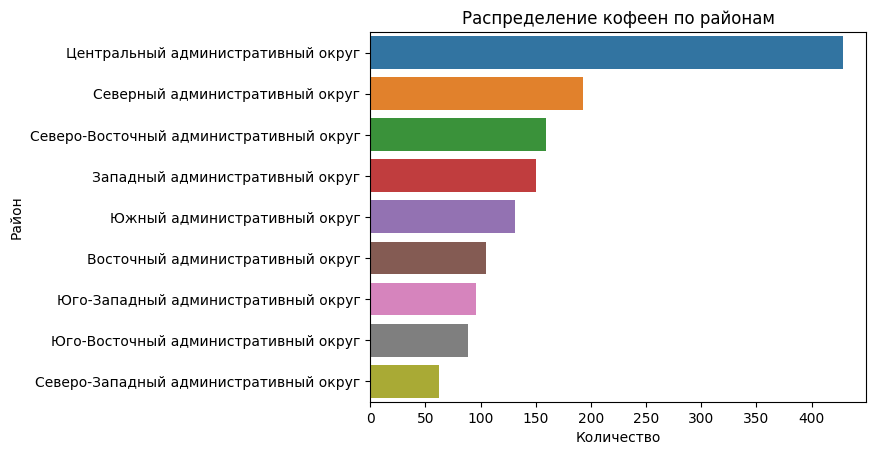

In [110]:
#построим визуализацию
sns.barplot(data=district_coffee, y='district', x='total')
plt.title('Распределение кофеен по районам')
plt.xlabel('Количество')
plt.ylabel('Район')
plt.show()

**Вывод:** Всего в Москве 1413 кофеен. Больше всего заведений расположено в Центральном округе - 428 точек. В топ-3 округов по количеству кофеен также входят Северный и Северо-Восточный округа - 193 и 159 точек соответственно. Меньше всего кофеен в Северо-Западном округе - 62 заведения. 

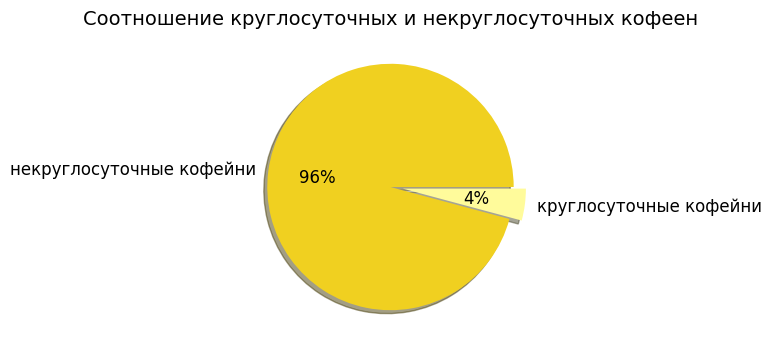

In [111]:
#найдем соотношение круглосуточных и некруглосуточных кофеен
plt.figure(figsize=(4,4))
plt.pie(data_coffeeshop.groupby('is_24/7')['name'].count(), autopct='%1.0f%%', labels = ['некруглосуточные кофейни', 'круглосуточные кофейни'], textprops={'fontsize': 12}, explode=(0,0.1), shadow=True, colors=['#f0d020', '#fffb9b'])
plt.title('Соотношение круглосуточных и некруглосуточных кофеен', fontdict={'fontsize': 14})
plt.show()

**Вывод:** Всего 4% кофеен в Москве являются круглосуточными.

In [112]:
#найдем средний рейтинг кофеен 
coffee_rating = data_coffeeshop.groupby('district', as_index=False)['rating'].mean().round(2).sort_values(by='rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [113]:
#построим фоновую картограмму
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m5)
m5

**Вывод:** Средний рейтинг кофеен в разных районах варьируется не сильно - от 4,2 до 4,34. Самый высокий рейтинг у кофеен расположеных в Центральном и Северо-Западном округах . Самый низкий у кофеен Западного округа. 

In [114]:
#найдем медианное значение чашки кофе по районам
avg_coffee_cup = data_coffeeshop.groupby('district', as_index=False)['middle_coffee_cup'].median().sort_values(by='middle_coffee_cup', ascending = False)
avg_coffee_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [115]:
#построим фоновую картограмму
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=geo_json,
    data=avg_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе в кофейнях по районам',
).add_to(m6)
m6

**Вывод:** Цена чашки кофе варьируется в разных районах в пределах от 135 до 198руб. Самая высокая стоимость в Юго-Западном, Центральном и Западном округах. Меньше всего чашка кофе стоит в Восточном округе. При открытии кофейни стоит ориентироваться на медианную стоимость чашки кофе в округе, чтобы быть конкурентоспособными. 

Так как новую кофейню планируется открыть в стиле кофейни Central Perk из сериала Друзья, то она скорее будет претендовать на статус туристического объекта, нежели на статус повседневной кофейни в спальном районе. В связи с этим я бы рекмендовала ориентироваться на Центральный округ. 

In [116]:
#посмотрим на популярность улиц Центрального района
data.query('district == "Центральный административный округ"').groupby('street', as_index=False)['name'].count().sort_values(by='name', ascending=False).rename(columns={'name': 'total'}).head(10)

,street,total
375,проспект Мира,52
273,Пятницкая улица,48
265,Пресненская набережная,43
381,улица Арбат,40
432,улица Покровка,40
239,Новослободская улица,36
175,Лесная улица,36
346,Усачёва улица,36
407,улица Земляной Вал,30
327,Таганская улица,29


In [117]:
#посмотрим на популярность улиц Центрального района
data.query('district == "Центральный административный округ"').groupby('street')['name'].count().min()

1

Разброс количества заведений на улицах Центрального района от 1 до 52. Самая популярная улица проспект Мира. Для новой кофейни я предлагаю ориентироваться на средне-популярные улицы, таким образом мы отсечем улицы, где мало заведений, а значит скорее всего маленький спрос и проходимость и также отсечем самые популярные улицы, где слишком высокая конкуренция. Найдем улицы, где количество заведений варьируется от 20 до 30.  

In [118]:
#найдем улицы с 20-30 заведениями
medium_street = data.query('district == "Центральный административный округ"').groupby('street', as_index=False)['name'].count().rename(columns={'name': 'total'}).sort_values(by='total', ascending=False).query('20 <= total <= 30')
medium_street

,street,total
407,улица Земляной Вал,30
327,Таганская улица,29
155,Комсомольский проспект,28
426,улица Новый Арбат,27
224,Нижняя Красносельская улица,27
216,Мясницкая улица,25
183,Малая Бронная улица,20
290,Садовническая улица,20


In [119]:
#посмотрим сколько на таких улицах кофеен
coffee_total = data.query('street in @medium_street.street & category == "кофейня"').groupby('street', as_index=False)['name'].count().rename(columns={'name': 'total'}).sort_values(by='total')
coffee_total

,street,total
1,Малая Бронная улица,1
2,Мясницкая улица,4
7,улица Новый Арбат,4
3,Нижняя Красносельская улица,5
0,Комсомольский проспект,6
4,Садовническая улица,6
5,Таганская улица,6
6,улица Земляной Вал,7


In [120]:
#отметим эти кофейни на карте
coffeeshops = data.query('street in @medium_street.street & category == "кофейня"')

m7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m7)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffeeshops.apply(create_clusters, axis=1)
m7

In [121]:
#найдем и добавим протяженность улицы и посчитаем количество кофеен на 1км
coffee_total['length'] = [0.95, 1.6, 1.5, 1, 3.6, 2, 1.17, 2.42]
coffee_total['density'] = round(coffee_total['total'] / coffee_total['length'], 2)
coffee_total.sort_values(by='density')

,street,total,length,density
1,Малая Бронная улица,1,0.95,1.05
0,Комсомольский проспект,6,3.60,1.67
2,Мясницкая улица,4,1.60,2.50
7,улица Новый Арбат,4,1.50,2.67
6,улица Земляной Вал,7,2.42,2.89
4,Садовническая улица,6,2.00,3.00
3,Нижняя Красносельская улица,5,1.00,5.00
5,Таганская улица,6,1.17,5.13


In [122]:
#посчитаем средний рейтинг кофеен 
coffee_rating = data.query('street in @medium_street.street & category == "кофейня"').groupby('street', as_index=False)['rating'].mean().round(2).sort_values(by='rating')
coffee_rating

,street,rating
0,Комсомольский проспект,4.17
5,Таганская улица,4.22
4,Садовническая улица,4.37
1,Малая Бронная улица,4.40
3,Нижняя Красносельская улица,4.40
6,улица Земляной Вал,4.40
7,улица Новый Арбат,4.42
2,Мясницкая улица,4.48


In [123]:
#найдем медианную стоимость чашки кофе
coffee_avg_bill = data.query('street in @medium_street.street & category == "кофейня"').groupby('street', as_index=False)['middle_coffee_cup'].median().sort_values(by='middle_coffee_cup')
coffee_avg_bill

,street,middle_coffee_cup
5,Таганская улица,152.5
7,улица Новый Арбат,175.0
6,улица Земляной Вал,177.5
0,Комсомольский проспект,218.0
4,Садовническая улица,221.5
3,Нижняя Красносельская улица,227.0
1,Малая Бронная улица,250.0
2,Мясницкая улица,283.0


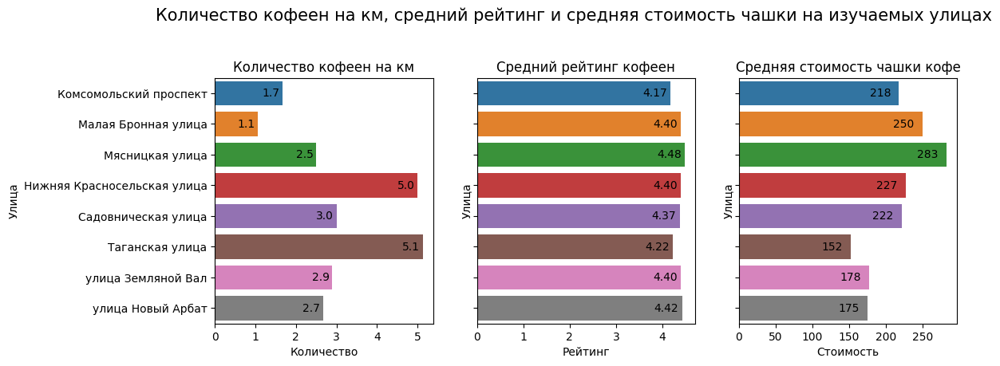

In [124]:
#построим визуализации
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,4), sharey=True)
fig.suptitle('Количество кофеен на км, средний рейтинг и средняя стоимость чашки на изучаемых улицах', y= 1.1, fontsize=15)

sns.barplot(ax = ax1, data=coffee_total.sort_values(by='street'), x='density', y = 'street')  
ax1.set_title('Количество кофеен на км')
ax1.set_xlabel('Количество')
ax1.set_ylabel('Улица')
for p in ax1.patches:
  height = p.get_height() 
  width = p.get_width() 
  ax1.text(x = width-0.5, y = p.get_y()+(height/2), s = '{:.1f}'.format(width), va = 'center') 

sns.barplot(ax = ax2, data = coffee_rating.sort_values(by='street'), y = 'street', x ='rating')  
ax2.set_title('Средний рейтинг кофеен')
ax2.set_xlabel('Рейтинг')
ax2.set_ylabel('Улица')
for p in ax2.patches:
  height = p.get_height() 
  width = p.get_width() 
  ax2.text(x = width-0.6, y = p.get_y()+(height/2), s = '{:.2f}'.format(width), va = 'center') 

sns.barplot(ax = ax3, data = coffee_avg_bill.sort_values(by='street'), y = 'street', x='middle_coffee_cup' )  
ax3.set_title('Средняя стоимость чашки кофе')
ax3.set_xlabel('Стоимость')
ax3.set_ylabel('Улица')
for p in ax3.patches:
  height = p.get_height() 
  width = p.get_width() 
  ax3.text(x = width-40, y = p.get_y()+(height/2), s = '{:.0f}'.format(width), va = 'center') 

plt.show()

**Вывод:** Всего мы нашли 8 улиц Центрального округа, с количеством заведений от 20 до 30. Проанализировав эти улицы, можно сделать следующие наблюдения:
 - Меньше всего кофеен на км на Малой Бронной улице, Комсомольском проспекте и Мясницкой улице - 1,1, 1,7 и 2,5 соответственно.
 - Среднии рейтинги кофеен варьируются не сильно - от 4,17 до 4,48. Самый низкий средний рейтинг на Комсомольском проспекте - 4,17. Самый высокий на Мясницкой улице.
 - Медианная стоимость чашки кофе варьируется от 152 до 283руб. Самая низкая стоимость на Таганской улице, самая высокая на Мясницкой. 

**Рекомендации:**

- Так как новую кофейню планируется открыть в стиле кофейни Central Perk из сериала Друзья, то она скорее будет претендовать на статус туристического объекта, нежели на статус повседневной кофейни в спальном районе. В связи с этим я бы рекомендовала ориентироваться на Центральный округ. Центральный район является лидером по количеству заведений в целом и кофеен в частности, но это скорее всего диктуется высоким спросом и проходимостью. 
- С точки зрения улиц, я бы рекомендовала рассмотреть средне-популярные улицы с 20-30 заведениями, чтобы удостовериться, что улица имеет хорошую проходимость, но при этом избежать высокой конкуренции. Я бы рекомендовала обратить внимание на Малую Бронную улицу, Комсомольский проспект и Мясницкую улицу, которые имееют самое маленькое количество кофеен на 1км в Центральном районе -  1,1, 1,7 и 2,5 соответственно.
- Комсомольский проспект также имеет самый низкий средний рейтинг кофеен - 4,17, что снижает конкуренцию на этой улице, при условии, что новая кофейня сможет добиться высокого рейтинга. 
- Стоит ориентироваться на медианную стоимость чашки кофе на выбранной улице, чтобы быть конкурентноспособным. 
- Рекомендуется открыть некруглосуточную кофейню, так как исходя из данных круглосуточные заведения составляют всего 4%, что скорее всего диктуется низким спросом на кофейни 24/7. 

## Презентация

Ссылка на презентацию : https://drive.google.com/file/d/1VHD_wWiCQGYTC0v0xOzM4XKYBlW9MVx2/view?usp=sharing